In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from zipfile import ZipFile
filename="/content/drive/My Drive/HAM10000.zip"
with ZipFile(filename,'r') as zip:
  zip.extractall()
  print("done")


done


In [1]:
import pandas as pd
import numpy as np
import os
import tensorflow as tf
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from  matplotlib import pyplot as plt
%matplotlib inline
import shutil
from sklearn.metrics import  precision_score, recall_score, accuracy_score,classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [2]:
data = pd.read_csv('data/HAM10000_metadata')
data.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,dataset
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,vidir_modern
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,vidir_modern
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,vidir_modern
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,vidir_modern
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,vidir_modern


In [3]:
unwanted_label = ['vasc', 'df']
data_pd = data.query("dx!=@unwanted_label")
print(data_pd['dx'].unique().tolist())

['bkl', 'nv', 'mel', 'bcc', 'akiec']


In [4]:
train_dir = os.path.join('HAM10000', 'train_dir')
test_dir = os.path.join('HAM10000', 'test_dir')

In [5]:
df_count = data_pd.groupby('lesion_id').count()
df_count.head()

,image_id,dx,dx_type,age,sex,localization,dataset
lesion_id,,,,,,,
HAM_0000000,2,2,2,2,2,2,2
HAM_0000001,1,1,1,1,1,1,1
HAM_0000002,3,3,3,3,3,3,3
HAM_0000003,1,1,1,1,1,1,1
HAM_0000004,1,1,1,1,1,1,1


In [6]:
df_count = df_count[df_count['dx'] == 1]
df_count.reset_index(inplace=True)

In [7]:
def duplicates(x):
    unique = set(df_count['lesion_id'])
    if x in unique:
        return 'no' 
    else:
        return 'duplicates'

In [8]:
data_pd['is_duplicate'] = data_pd['lesion_id'].apply(duplicates)
data_pd.head()

d:\pythonproject\hamclassification\venv\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,lesion_id,image_id,dx,dx_type,age,sex,localization,dataset,is_duplicate
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,vidir_modern,duplicates
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,vidir_modern,duplicates
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,vidir_modern,duplicates
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,vidir_modern,duplicates
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,vidir_modern,duplicates


In [9]:
df_count = data_pd[data_pd['is_duplicate'] == 'no']

In [10]:
train, test_df = train_test_split(df_count, test_size=0.15, stratify=df_count['dx'])

In [11]:
def identify_trainOrtest(x):
    test_data = set(test_df['image_id'])
    if str(x) in test_data:
        return 'test'
    else:
        return 'train'

#creating train_df
data_pd['train_test_split'] = data_pd['image_id'].apply(identify_trainOrtest)
train_df = data_pd[data_pd['train_test_split'] == 'train']
train_df.head()

d:\pythonproject\hamclassification\venv\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


,lesion_id,image_id,dx,dx_type,age,sex,localization,dataset,is_duplicate,train_test_split
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,vidir_modern,duplicates,train
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,vidir_modern,duplicates,train
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,vidir_modern,duplicates,train
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,vidir_modern,duplicates,train
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,vidir_modern,duplicates,train


In [12]:
test_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,dataset,is_duplicate
5921,HAM_0002805,ISIC_0031722,nv,follow_up,50.0,male,trunk,vidir_molemax,no
5419,HAM_0004493,ISIC_0030325,nv,follow_up,60.0,male,upper extremity,vidir_molemax,no
3239,HAM_0002466,ISIC_0030128,nv,follow_up,30.0,female,back,vidir_molemax,no
299,HAM_0006325,ISIC_0027739,bkl,histo,50.0,male,lower extremity,rosendahl,no
1049,HAM_0001443,ISIC_0025804,bkl,consensus,50.0,male,lower extremity,vidir_molemax,no


In [13]:
# Image id of train and test images
train_list = list(train_df['image_id'])
test_list = list(test_df['image_id'])

In [14]:
len(test_list)

812

In [15]:
len(train_list)

8946

In [16]:
# Set the image_id as the index in data_pd
data_pd.set_index('image_id', inplace=True)

In [17]:
os.mkdir(train_dir)
os.mkdir(test_dir)

In [18]:
targetnames = ['akiec', 'bcc', 'bkl', 'mel', 'nv']

In [19]:
for i in targetnames:
  directory1=train_dir+'/'+i
  directory2=test_dir+'/'+i
  os.mkdir(directory1)
  os.mkdir(directory2)

In [20]:
for image in train_list:
    file_name = image+'.jpg'
    label = data_pd.loc[image, 'dx']

    # path of source image 
    source = os.path.join('HAM10000', file_name)

    # copying the image from the source to target file
    target = os.path.join(train_dir, label, file_name)

    shutil.copyfile(source, target)

In [21]:
for image in test_list:

    file_name = image+'.jpg'
    label = data_pd.loc[image, 'dx']

    # path of source image 
    source = os.path.join('HAM10000', file_name)

    # copying the image from the source to target file
    target = os.path.join(test_dir, label, file_name)

    shutil.copyfile(source, target)

In [23]:
targetnames = ['akiec', 'bcc', 'bkl', 'mel', 'nv']

# Augmenting images and storing them in temporary directories 
for img_class in targetnames:

    #creating temporary directories
    # creating a base directory
    aug_dir = 'aug_dir'
    os.mkdir(aug_dir)
    # creating a subdirectory inside the base directory for images of the same class
    img_dir = os.path.join(aug_dir, 'img_dir')
    os.mkdir(img_dir)

    img_list = os.listdir('HAM10000/train_dir/' + img_class)

    # Copy images from the class train dir to the img_dir 
    for file_name in img_list:

        # path of source image in training directory
        source = os.path.join('HAM10000/train_dir/' + img_class, file_name)

        # creating a target directory to send images 
        target = os.path.join(img_dir, file_name)

        # copying the image from the source to target file
        shutil.copyfile(source, target)

    # Temporary augumented dataset directory.
    source_path = aug_dir

    # Augmented images will be saved to training directory
    save_path = 'HAM10000/train_dir/' + img_class

    # Creating Image Data Generator to augment images
    datagen = tf.keras.preprocessing.image.ImageDataGenerator(

        rotation_range=180,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True,
        vertical_flip=True,
        fill_mode='nearest'

    )

    batch_size = 50

    aug_datagen = datagen.flow_from_directory(source_path,save_to_dir=save_path,save_format='jpg',target_size=(299,299),batch_size=batch_size)

    # Generate the augmented images
    aug_images = 8000 

    num_files = len(os.listdir(img_dir))
    num_batches = int(np.ceil((aug_images - num_files) / batch_size))

    # creating 8000 augmented images per class
    for i in range(0, num_batches):
        images, labels = next(aug_datagen)

    # delete temporary directory 
    shutil.rmtree('aug_dir')


Found 304 images belonging to 1 classes.
Found 488 images belonging to 1 classes.
Found 1033 images belonging to 1 classes.
Found 1079 images belonging to 1 classes.
Found 6042 images belonging to 1 classes.


In [25]:
train_path = 'HAM10000/train_dir'
test_path = 'HAM10000/test_dir'
batch_size=16

In [26]:
datagen=ImageDataGenerator(preprocessing_function=tf.keras.applications.inception_resnet_v2.preprocess_input)

In [27]:
image_size = 299
print("\nTrain Batches: ")
train_batches = datagen.flow_from_directory(directory=train_path,
                                            target_size=(image_size,image_size),
                                            batch_size=batch_size,
                                            shuffle=True)

print("\nTest Batches: ")
test_batches =datagen.flow_from_directory(test_path,
                                           target_size=(image_size,image_size),
                                           batch_size=batch_size,
                                           shuffle=False)


Train Batches: 
Found 8946 images belonging to 5 classes.

Test Batches: 
Found 812 images belonging to 5 classes.


In [28]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras import regularizers

input_shape = (299, 299, 3)

num_labels = 5

base_model = InceptionV3(include_top=False, input_shape=(299, 299, 3),pooling = 'avg')
model = Sequential()
model.add(base_model)
model.add(Dropout(0.5))
model.add(Dense(128, activation="relu",kernel_regularizer=regularizers.l2(0.02)))
model.add(Dropout(0.5))
model.add(Dense(5, activation = 'softmax',kernel_regularizer=regularizers.l2(0.02)))

for layer in base_model.layers:
    layer.trainable = True

#for layer in base_model.layers[-30:]:
 #   layer.trainable = True

#model.add(ResNet50(include_top = False, pooling = 'max', weights = '../input/resnet50/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'))

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Functional)    (None, 2048)              21802784  
_________________________________________________________________
dropout (Dropout)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 128)               262272    
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 645       
Total params: 22,065,701
Trainable params: 22,031,269
Non-trainable params: 34,432
_________________________________________________________________


In [29]:
opt1=tf.keras.optimizers.Adam(learning_rate=0.01,epsilon=0.1)
model.compile(optimizer=opt1,
             loss='categorical_crossentropy',
             metrics=['accuracy'])

In [30]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

class_weights = {
                    0: 1.0,  # bkl
                    1: 1.0,  # nv
                    2: 5.0,  # mel
                    3: 1.0,  # bcc
                    4: 1.0,  # akiec
                }
                #['bkl', 'nv', 'mel', 'bcc', 'akiec']


checkpoint=  ModelCheckpoint(filepath = 'InceptionV3nonaug.hdf5',monitor='val_accuracy',save_best_only=True,save_weights_only=True)




In [ ]:
# Earlystop = EarlyStopping(monitor='val_loss', mode='min',patience=40, min_delta=0.001)
# history = model.fit(train_batches,
#                     steps_per_epoch=(len(train_df)/10),
#                     epochs=100,
#                     verbose=1,
#                     validation_data=test_batches,validation_steps=len(test_df)/batch_size,callbacks=[checkpoint,Earlystop],class_weight=class_weights)

Epoch 1/100
918/918 [==============================] - 323s 340ms/step - loss: 3.7203 - accuracy: 0.3938 - val_loss: 0.9889 - val_accuracy: 0.7746
Epoch 2/100
918/918 [==============================] - 305s 332ms/step - loss: 1.8500 - accuracy: 0.4685

KeyboardInterrupt: 

In [ ]:
# Earlystop = EarlyStopping(monitor='val_loss', mode='min',patience=40, min_delta=0.001)
# history = model.fit(train_batches,
#                     steps_per_epoch=(len(train_df)/batch_size),
#                     epochs=100,
#                     verbose=1,
#                     validation_data=test_batches,
#                     validation_steps=len(test_df)/batch_size,
#                     callbacks=[checkpoint,Earlystop],class_weight=class_weights)

Epoch 1/100
559/559 [==============================] - 213s 356ms/step - loss: 4.5449 - accuracy: 0.4219 - val_loss: 1.4242 - val_accuracy: 0.8424

KeyboardInterrupt: 

In [23]:
# skenario 1 (dengan menggunakan augmentasi)
# Earlystop = EarlyStopping(monitor='val_loss', mode='min',patience=40, min_delta=0.001)
# history = model.fit(train_batches,
#                     steps_per_epoch=(len(train_df)/batch_size),
#                     epochs=100,
#                     verbose=1,
#                     validation_data=test_batches,
#                     validation_steps=len(test_df)/batch_size,
#                     callbacks=[checkpoint,Earlystop],class_weight=class_weights)

Epoch 1/100
559/559 [==============================] - 216s 361ms/step - loss: 4.6724 - accuracy: 0.3791 - val_loss: 1.4391 - val_accuracy: 0.8411

In [31]:
##skenario 2 tanpa augmentasi
Earlystop = EarlyStopping(monitor='val_loss', mode='min',patience=40, min_delta=0.001)
history = model.fit(train_batches,
                    steps_per_epoch=(len(train_df)/batch_size),
                    epochs=100,
                    verbose=1,
                    validation_data=test_batches,
                    validation_steps=len(test_df)/batch_size,
                    callbacks=[checkpoint,Earlystop],class_weight=class_weights)

Epoch 1/100
559/559 [==============================] - 213s 356ms/step - loss: 4.0183 - accuracy: 0.6175 - val_loss: 1.6227 - val_accuracy: 0.5579

In [32]:
from tensorflow.keras import models
model.load_weights("InceptionV3nonaug.hdf5")

In [33]:
predictions = model.predict(test_batches, steps=len(test_df)/batch_size, verbose=0)

In [35]:
#geting predictions on test dataset
y_pred = np.argmax(predictions, axis=1)
targetnames = ['akiec', 'bcc', 'bkl', 'mel', 'nv']
#getting the true labels per image 
y_true = test_batches.classes
#getting the predicted labels per image 
y_prob=predictions
from tensorflow.keras.utils import to_categorical
y_test = to_categorical(y_true)

# Creating classification report 
report = classification_report(y_true, y_pred, target_names=targetnames)

print("\nClassification Report:")
print(report)


Classification Report:
              precision    recall  f1-score   support

       akiec       0.53      0.39      0.45        23
         bcc       0.72      0.81      0.76        26
         bkl       0.63      0.74      0.68        66
         mel       0.67      0.24      0.35        34
          nv       0.95      0.97      0.96       663

    accuracy                           0.90       812
   macro avg       0.70      0.63      0.64       812
weighted avg       0.89      0.90      0.89       812



<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='True Label', ylabel='Predicted Tabel'>

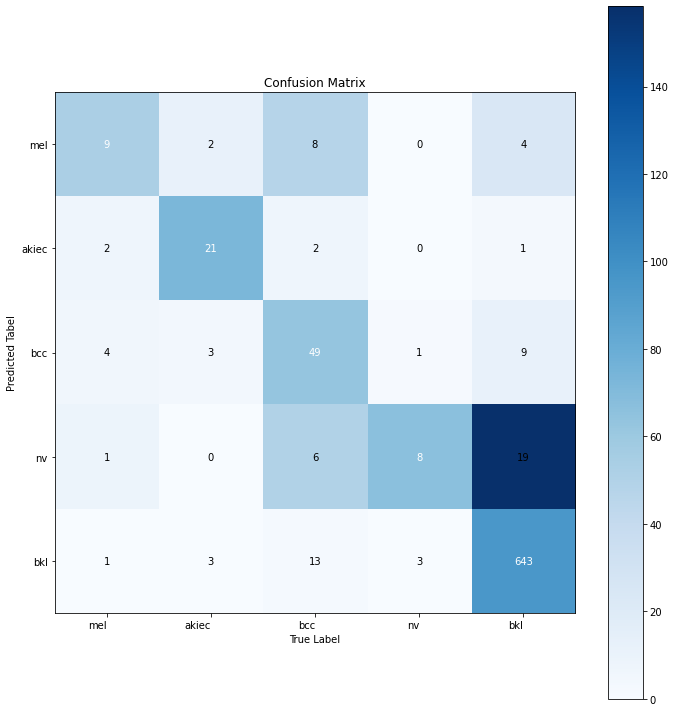

In [43]:
from ConfusionMatrix import plot_confusion_matrix

plot_confusion_matrix(y_true,y_pred, classes=targetnames,normalize=True, title='Confusion Matrix')

In [36]:
print("Precision: "+ str(precision_score(y_true, y_pred, average='weighted')))
print("Recall: "+ str(recall_score(y_true, y_pred, average='weighted')))
print("Accuracy: " + str(accuracy_score(y_true, y_pred)))
print("weighted Roc score: " + str(roc_auc_score(y_test,y_prob,multi_class='ovr',average='weighted')))

Precision: 0.8938015730393502
Recall: 0.8990147783251231
Accuracy: 0.8990147783251231
weighted Roc score: 0.9570731797063355


In [37]:

print("Precision: "+ str(precision_score(y_true, y_pred, average='macro')))
print("Recall: "+ str(recall_score(y_true, y_pred, average='macro')))
print("Accuracy: " + str(accuracy_score(y_true, y_pred)))
print("Macro Roc score: " + str(roc_auc_score(y_test,y_prob,multi_class='ovr',average='macro')))

Precision: 0.6999209845129646
Recall: 0.6293098206141685
Accuracy: 0.8990147783251231
Macro Roc score: 0.9444452715607554


In [38]:
print("Precision: "+ str(precision_score(y_true, y_pred, average='micro')))
print("Recall: "+ str(recall_score(y_true, y_pred, average='micro')))
print("Accuracy: " + str(accuracy_score(y_true, y_pred)))
tpr={}
fpr={}
roc_auc={}
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_prob.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
print("Micro Roc score: " + str(roc_auc["micro"]))

Precision: 0.8990147783251231
Recall: 0.8990147783251231
Accuracy: 0.8990147783251231
Micro Roc score: 0.983676388956296


In [39]:
fpr = {}
tpr = {}
roc_auc = {}
for i in range(5):
    r = roc_auc_score(y_test[:, i], y_prob[:, i])
    print("The ROC AUC score of "+targetnames[i]+" is: "+str(r))

The ROC AUC score of akiec is: 0.9520581914366011
The ROC AUC score of bcc is: 0.9847817576825211
The ROC AUC score of bkl is: 0.9662645218945487
The ROC AUC score of mel is: 0.8588386511416906
The ROC AUC score of nv is: 0.9602832356484154


In [40]:
# Compute ROC curve and ROC area for each class
fpr = {}
tpr = {}
roc_auc = dict()
for i in range(5):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_prob[:, i], drop_intermediate=False)
    roc_auc[i] = auc(fpr[i], tpr[i])

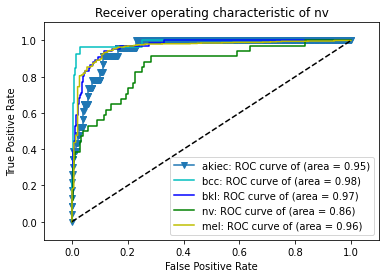

In [41]:

plt.plot(fpr[0], tpr[0],'v-',label='akiec: ROC curve of (area = %0.2f)' % roc_auc[0])
plt.plot(fpr[1], tpr[1],'c',label='bcc: ROC curve of (area = %0.2f)' % roc_auc[1])
plt.plot(fpr[2], tpr[2],'b',label='bkl: ROC curve of (area = %0.2f)' % roc_auc[2])
plt.plot(fpr[3], tpr[3],'g',label='nv: ROC curve of (area = %0.2f)' % roc_auc[3])
plt.plot(fpr[4], tpr[4],'y',label='mel: ROC curve of (area = %0.2f)' % roc_auc[4])



plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic of %s'%targetnames[i])
plt.legend(loc="lower right")
plt.show()